# Ultrasound Muscle Segmentation — Classical ML Pipeline v6

**Reference:** Noble & Boukerroui (2006) — IEEE Transactions on Medical Imaging

## Changes from v5

| Change | Detail |
|---|---|
| Feature pruning | Removed `gx_s1`, `gy_s1`, `gmag_s1`, `std_7` → 20 features |
| Sampling | 4000/image: 1500 muscle / 2000 boundary / 500 random |
| Augmentation | Intensity-only per training image (brightness, contrast, noise) |
| Threshold tuning | `predict_proba` + global threshold swept on validation |
| Prob smoothing | Gaussian σ=2 on probability map before thresholding |
| ACSA output | Pixel area (primary) + cm² (secondary, approximate) |

## Pipeline Architecture

```
Raw Images
    ↓
Preprocessing (scan crop → median → CLAHE → normalise)
    ↓
Intensity Augmentation (training only)
    ↓
Feature Extraction (20 features/pixel)
    ↓
Stratified Sampling (1500 muscle / 2000 boundary / 500 random)
    ↓
Random Forest Training (200 trees, Gini impurity)
    ↓
predict_proba → Gaussian smoothing → threshold tuning on val
    ↓
Postprocessing (closing → hole fill → largest component)
    ↓
ACSA (pixel area primary, cm² secondary)
    ↓
Evaluation (Dice, IoU — image-level 70/15/15 split)
```

## Section 1 — Imports

In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import cv2
import warnings
import json
import time
import random
from pathlib import Path
from IPython.display import display as ipy_display

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage.morphology import disk, binary_closing, remove_small_objects
from skimage.measure import label, regionprops
from skimage.filters.rank import entropy as rank_entropy
from skimage.feature import graycomatrix, graycoprops

from scipy.ndimage import binary_fill_holes, distance_transform_edt, gaussian_filter

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

import joblib

warnings.filterwarnings('ignore')
print('✓ Imports complete')

✓ Imports complete


## Section 2 — Configuration

All hyperparameters in one place. Changes from v5 are marked.

In [3]:
class Config:
    # ── Paths ──────────────────────────────────────────────────────────────
    BASE_DIR      = Path("/kaggle/input/datasets/aashakaashara/rf-input/rf_inputs")
    IMAGE_DIR     = BASE_DIR / "images"
    MASK_DIR      = BASE_DIR / "segmentation_masks"
    METADATA_PATH = BASE_DIR / "Results.xlsx"
    FAILED_PATH   = BASE_DIR / "failed_images.txt"
    OUTPUT_DIR    = Path("/kaggle/working/outputs")
    MODEL_PATH    = OUTPUT_DIR / "rf_model_v6.joblib"
    RESULTS_PATH  = OUTPUT_DIR / "results_v6.json"

    # ── Reproducibility ────────────────────────────────────────────────────
    RANDOM_SEED   = 42

    # ── Dataset split ──────────────────────────────────────────────────────
    TRAIN_RATIO   = 0.70
    VAL_RATIO     = 0.15
    TEST_RATIO    = 0.15

    # ── Preprocessing ──────────────────────────────────────────────────────
    SCAN_THRESHOLD  = 10
    MEDIAN_KSIZE    = 5
    CLAHE_CLIP      = 2.0
    CLAHE_GRID      = (8, 8)

    # ── Augmentation (NEW in v6) ────────────────────────────────────────────
    # Intensity-only. Applied to training images only, before sampling.
    AUG_BRIGHTNESS  = (0.85, 1.15)   # multiplicative brightness range
    AUG_CONTRAST    = (0.85, 1.15)   # multiplicative contrast range
    AUG_NOISE_SIGMA = (2, 5)         # Gaussian noise std range (pixel units)

    # ── Feature extraction (v6: 20 features) ──────────────────────────────
    # Removed vs v5: gx_s1, gy_s1, gmag_s1, std_7
    WINDOW_SMALL    = 7
    WINDOW_MED      = 21
    WINDOW_LARGE    = 51
    WINDOW_XL       = 71
    TEXTURE_RADIUS  = 15
    GRAD_SIGMA_COARSE = 3            # only coarse-scale gradients kept
    GLCM_PATCH_SIZE = 32
    GLCM_DISTANCES  = [1]
    GLCM_ANGLES     = [0, np.pi/4, np.pi/2, 3*np.pi/4]

    # ── Sampling (NEW in v6: 4000/image, more boundary) ───────────────────
    N_MUSCLE        = 1500
    N_BOUNDARY_NEG  = 2000           # was 1050 in v5
    N_RANDOM_NEG    = 500            # was 450 in v5
    BOUNDARY_MIN    = 5
    BOUNDARY_MAX    = 50

    # ── Random Forest ──────────────────────────────────────────────────────
    RF_N_ESTIMATORS     = 200
    RF_MAX_DEPTH        = 20
    RF_MIN_SAMPLES_LEAF = 4
    RF_N_JOBS           = -1

    # ── Threshold tuning (NEW in v6) ───────────────────────────────────────
    # Coarse sweep on validation, then fine refinement around best
    THRESHOLD_COARSE = [0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60]
    THRESHOLD_FINE_DELTA = 0.02      # ±0.02 around best coarse value
    PROB_SMOOTH_SIGMA    = 2.0       # Gaussian sigma for probability smoothing

    # ── Postprocessing ─────────────────────────────────────────────────────
    MORPH_CLOSE_RADIUS = 5
    MIN_COMPONENT_SIZE = 500

    # ── ACSA ───────────────────────────────────────────────────────────────
    # Primary output: pixel area
    # Secondary output: cm² (approximate, dataset-calibrated)


cfg = Config()
cfg.OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
np.random.seed(cfg.RANDOM_SEED)
random.seed(cfg.RANDOM_SEED)

print('✓ Configuration loaded')
print(f'  Sampling : {cfg.N_MUSCLE} muscle | {cfg.N_BOUNDARY_NEG} boundary | '
      f'{cfg.N_RANDOM_NEG} random = {cfg.N_MUSCLE+cfg.N_BOUNDARY_NEG+cfg.N_RANDOM_NEG}/image')
print(f'  Threshold sweep: coarse {cfg.THRESHOLD_COARSE}, '
      f'fine ±{cfg.THRESHOLD_FINE_DELTA}')

✓ Configuration loaded
  Sampling : 1500 muscle | 2000 boundary | 500 random = 4000/image
  Threshold sweep: coarse [0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6], fine ±0.02


## Section 3 — Data Loading and Image-Level Split

The 70/15/15 split is performed at the **image level** before any feature extraction.  
No pixel from a validation or test image is ever seen during training.

In [4]:
def load_failed_images(path):
    """Parse failed_images.txt which contains full Windows paths."""
    failed = set()
    if path.exists():
        with open(path, 'r') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                # Format: "Scalingline not found in C:/ML_PRO\rectus_img_352.tif"
                last_token = line.split()[-1].replace('\\', '/')
                filename   = last_token.split('/')[-1]
                stem       = Path(filename).stem
                failed.add(filename)
                failed.add(stem)
        print(f'  Excluded : {len(failed)//2} failed images')
    else:
        print(f'  WARNING  : failed_images.txt not found')
    return failed


def load_metadata(path):
    df = pd.read_excel(path)
    df.columns = [c.strip() for c in df.columns]
    df['stem'] = df['File'].astype(str).str.strip()
    print(f'  Metadata : {len(df)} rows')
    return df


def get_image_pairs(image_dir, mask_dir, failed_set):
    pairs      = []
    valid_exts = {'.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'}
    for img_path in sorted(image_dir.iterdir()):
        if img_path.suffix.lower() not in valid_exts:
            continue
        if img_path.name in failed_set or img_path.stem in failed_set:
            continue
        mask_path = None
        for ext in valid_exts:
            c = mask_dir / (img_path.stem + ext)
            if c.exists():
                mask_path = c
                break
        if mask_path is not None:
            pairs.append((img_path, mask_path))
    print(f'  Valid pairs: {len(pairs)}')
    return pairs


def split_pairs(pairs, train_r, val_r, seed):
    test_r     = 1.0 - train_r - val_r
    train, tmp = train_test_split(pairs, test_size=(val_r+test_r), random_state=seed)
    val, test  = train_test_split(tmp, test_size=(test_r/(val_r+test_r)), random_state=seed)
    return train, val, test


def load_image_raw(path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise IOError(f'Cannot read: {path}')
    return img


def load_mask_raw(path):
    mask = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise IOError(f'Cannot read: {path}')
    return (mask > 127).astype(np.uint8)


print('[DATA LOADING]')
failed_set  = load_failed_images(cfg.FAILED_PATH)
metadata    = load_metadata(cfg.METADATA_PATH)
all_pairs   = get_image_pairs(cfg.IMAGE_DIR, cfg.MASK_DIR, failed_set)
train_pairs, val_pairs, test_pairs = split_pairs(
    all_pairs, cfg.TRAIN_RATIO, cfg.VAL_RATIO, cfg.RANDOM_SEED
)
print(f'\n  Image-level split (seed={cfg.RANDOM_SEED}):')
print(f'    Train : {len(train_pairs)}  ({len(train_pairs)/len(all_pairs)*100:.1f}%)')
print(f'    Val   : {len(val_pairs)}   ({len(val_pairs)/len(all_pairs)*100:.1f}%)')
print(f'    Test  : {len(test_pairs)}   ({len(test_pairs)/len(all_pairs)*100:.1f}%)  ← held-out, touched once')

[DATA LOADING]
  Excluded : 174 failed images
  Metadata : 338 rows
  Valid pairs: 338

  Image-level split (seed=42):
    Train : 236  (69.8%)
    Val   : 50   (14.8%)
    Test  : 52   (15.4%)  ← held-out, touched once


## Section 4 — Preprocessing

Applied to every image before feature extraction:
1. Detect scan region (threshold >10) and crop to bounding box
2. Median filter (kernel 5) — speckle noise reduction
3. CLAHE — adaptive contrast enhancement
4. Normalise to float32 [0, 1]

In [5]:
def preprocess(img_raw, mask_raw=None):
    """
    Preprocess one ultrasound image.
    Returns dict with img_proc, scan_mask, crop_bbox, orig_shape,
    and optionally mask_cropped.
    """
    orig_shape = img_raw.shape
    scan_full  = img_raw > cfg.SCAN_THRESHOLD

    rows = np.where(scan_full.any(axis=1))[0]
    cols = np.where(scan_full.any(axis=0))[0]
    if len(rows) == 0 or len(cols) == 0:
        r0, r1, c0, c1 = 0, orig_shape[0], 0, orig_shape[1]
    else:
        r0, r1 = int(rows[0]), int(rows[-1]) + 1
        c0, c1 = int(cols[0]), int(cols[-1]) + 1

    img_crop  = img_raw[r0:r1, c0:c1]
    scan_crop = scan_full[r0:r1, c0:c1]

    img_med  = cv2.medianBlur(img_crop, cfg.MEDIAN_KSIZE)
    clahe    = cv2.createCLAHE(clipLimit=cfg.CLAHE_CLIP, tileGridSize=cfg.CLAHE_GRID)
    img_cl   = clahe.apply(img_med)
    img_proc = img_cl.astype(np.float32) / 255.0

    result = {
        'img_proc':   img_proc,
        'scan_mask':  scan_crop,
        'crop_bbox':  (r0, r1, c0, c1),
        'orig_shape': orig_shape,
    }
    if mask_raw is not None:
        result['mask_cropped'] = mask_raw[r0:r1, c0:c1]
    return result


print('✓ Preprocessing defined')

✓ Preprocessing defined


## Section 5 — Intensity Augmentation (Training Only)

Applied to each training image to produce one augmented copy.  
Augmentation is performed **at the image level before sampling**, so all feature  
relationships (GLCM, gradients, entropy) remain physically consistent.

**Augmentation types:**
- Random brightness scaling (0.85–1.15)
- Random contrast scaling (0.85–1.15)
- Mild Gaussian noise (σ = 2–5 pixel units)

**Not used:** rotations, flips, warping — these would break the anatomical spatial prior.

In [6]:
def augment_image(img_raw, rng):
    """
    Apply intensity-only augmentation to a uint8 grayscale image.
    Returns augmented uint8 image.
    """
    img = img_raw.astype(np.float32)

    # Brightness scaling
    brightness = rng.uniform(*cfg.AUG_BRIGHTNESS)
    img = img * brightness

    # Contrast scaling (around mean)
    contrast = rng.uniform(*cfg.AUG_CONTRAST)
    mean_val = img.mean()
    img      = mean_val + contrast * (img - mean_val)

    # Gaussian noise
    sigma = rng.uniform(*cfg.AUG_NOISE_SIGMA)
    noise = rng.normal(0, sigma, img.shape).astype(np.float32)
    img   = img + noise

    return np.clip(img, 0, 255).astype(np.uint8)


print('✓ Augmentation defined')
print(f'  Brightness : {cfg.AUG_BRIGHTNESS}')
print(f'  Contrast   : {cfg.AUG_CONTRAST}')
print(f'  Noise σ    : {cfg.AUG_NOISE_SIGMA}')

✓ Augmentation defined
  Brightness : (0.85, 1.15)
  Contrast   : (0.85, 1.15)
  Noise σ    : (2, 5)


## Section 6 — Feature Extraction (20 Features per Pixel)

| Group | Features | Count |
|---|---|---|
| Local intensity stats | mean_7, mean/std at 21, 51, 71 px | 7 |
| Intensity ratio | mean_7 / mean_71 | 1 |
| Rank texture | entropy r=15, variance r=15 | 2 |
| Coarse gradients | gx_s3, gy_s3, gmag_s3, laplacian | 4 |
| GLCM patch texture | contrast, homogeneity, energy, correlation | 4 |
| Spatial | dist_boundary, dist_center | 2 |
| **Total** | | **20** |

**Removed from v5:** `gx_s1`, `gy_s1`, `gmag_s1` (fine-scale direction not useful for RF),  
`std_7` (too local, consistently weak).  
**Finding:** Model prefers regional context (71px windows, GLCM patches) over local detail.

In [7]:
FEATURE_NAMES = [
    # Group A — Local intensity stats
    'mean_7',
    'mean_21',   'std_21',
    'mean_51',   'std_51',
    'mean_71',   'std_71',
    # Group B — Intensity ratio
    'intensity_ratio',
    # Group C — Rank texture
    'entropy_r15',
    'variance_r15',
    # Group D — Coarse gradients + Laplacian (fine-scale removed)
    'gx_s3', 'gy_s3', 'gmag_s3',
    'laplacian',
    # Group E — GLCM patch texture
    'glcm_contrast',
    'glcm_homogeneity',
    'glcm_energy',
    'glcm_correlation',
    # Group F — Spatial prior
    'dist_boundary',
    'dist_center',
]
N_FEATURES = len(FEATURE_NAMES)
print(f'Feature count: {N_FEATURES}')
print(f'Features: {FEATURE_NAMES}')


def _local_stats(img, k):
    mean = cv2.boxFilter(img, -1, (k, k)).astype(np.float32)
    sq   = cv2.boxFilter(img**2, -1, (k, k)).astype(np.float32)
    std  = np.sqrt(np.clip(sq - mean**2, 0, None))
    return mean, std


def _compute_glcm_patch_features(img_8u, patch_size):
    """
    Non-overlapping 32×32 patches. One GLCM per patch, averaged over
    4 directions. Grey levels quantised 256 → 32 for speed.
    Returns (H, W, 4) float32 array.
    """
    H, W      = img_8u.shape
    feat_maps = np.zeros((H, W, 4), dtype=np.float32)
    for r in range(0, H, patch_size):
        for c in range(0, W, patch_size):
            patch = img_8u[r:r+patch_size, c:c+patch_size]
            if patch.mean() < 5:
                continue
            patch_r = (patch // 8).astype(np.uint8)
            try:
                glcm = graycomatrix(patch_r,
                                    distances=cfg.GLCM_DISTANCES,
                                    angles=cfg.GLCM_ANGLES,
                                    levels=32, symmetric=True, normed=True)
                vals = [
                    float(graycoprops(glcm, 'contrast').mean()),
                    float(graycoprops(glcm, 'homogeneity').mean()),
                    float(graycoprops(glcm, 'energy').mean()),
                    float(graycoprops(glcm, 'correlation').mean()),
                ]
            except Exception:
                vals = [0.0, 0.0, 0.0, 0.0]
            r_end = min(r+patch_size, H)
            c_end = min(c+patch_size, W)
            for i, v in enumerate(vals):
                feat_maps[r:r_end, c:c_end, i] = v
    for i in range(4):
        fmap = feat_maps[:, :, i]
        fmin, fmax = fmap.min(), fmap.max()
        if fmax > fmin:
            feat_maps[:, :, i] = (fmap - fmin) / (fmax - fmin)
    return feat_maps


def extract_features(img_proc, scan_mask):
    """Build (H*W, N_FEATURES) feature matrix from preprocessed image."""
    H, W   = img_proc.shape
    img_8u = (img_proc * 255).astype(np.uint8)

    # Group A
    mean_s,  _      = _local_stats(img_proc, cfg.WINDOW_SMALL)
    mean_m,  std_m  = _local_stats(img_proc, cfg.WINDOW_MED)
    mean_l,  std_l  = _local_stats(img_proc, cfg.WINDOW_LARGE)
    mean_xl, std_xl = _local_stats(img_proc, cfg.WINDOW_XL)

    # Group B
    intensity_ratio = np.clip(mean_s / (mean_xl + 1e-8), 0, 5).astype(np.float32)

    # Group C
    selem     = disk(cfg.TEXTURE_RADIUS)
    f_entropy = rank_entropy(img_8u, selem).astype(np.float32)
    f_entropy = f_entropy / (f_entropy.max() + 1e-8)
    _, f_var  = _local_stats(img_proc, cfg.TEXTURE_RADIUS * 2 + 1)

    # Group D — coarse scale only
    img_g3  = cv2.GaussianBlur(img_8u, (0, 0), sigmaX=cfg.GRAD_SIGMA_COARSE)
    gx3     = cv2.Sobel(img_g3, cv2.CV_32F, 1, 0, ksize=3)
    gy3     = cv2.Sobel(img_g3, cv2.CV_32F, 0, 1, ksize=3)
    gmag3   = np.sqrt(gx3**2 + gy3**2).astype(np.float32)
    gx3_n   = (gx3   / (np.abs(gx3).max()  + 1e-8)).astype(np.float32)
    gy3_n   = (gy3   / (np.abs(gy3).max()  + 1e-8)).astype(np.float32)
    gmag3_n = (gmag3 / (gmag3.max()         + 1e-8)).astype(np.float32)
    lap     = cv2.Laplacian(img_8u, cv2.CV_32F)
    lap_n   = ((lap - lap.min()) / (lap.max() - lap.min() + 1e-8)).astype(np.float32)

    # Group E
    glcm_maps = _compute_glcm_patch_features(img_8u, cfg.GLCM_PATCH_SIZE)

    # Group F
    dist_b = distance_transform_edt(scan_mask.astype(np.uint8)).astype(np.float32)
    dist_b = (dist_b / (dist_b.max() + 1e-8)).astype(np.float32)
    ri, ci = np.where(scan_mask)
    cr     = ri.mean() if len(ri) > 0 else H / 2
    cc     = ci.mean() if len(ci) > 0 else W / 2
    yy, xx = np.mgrid[0:H, 0:W]
    dist_c = np.sqrt((yy - cr)**2 + (xx - cc)**2).astype(np.float32)
    dist_c = (dist_c / (dist_c.max() + 1e-8)).astype(np.float32)

    feat = np.column_stack([
        mean_s.ravel(),
        mean_m.ravel(),   std_m.ravel(),
        mean_l.ravel(),   std_l.ravel(),
        mean_xl.ravel(),  std_xl.ravel(),
        intensity_ratio.ravel(),
        f_entropy.ravel(),
        f_var.ravel(),
        gx3_n.ravel(),    gy3_n.ravel(),   gmag3_n.ravel(),
        lap_n.ravel(),
        glcm_maps[:, :, 0].ravel(),
        glcm_maps[:, :, 1].ravel(),
        glcm_maps[:, :, 2].ravel(),
        glcm_maps[:, :, 3].ravel(),
        dist_b.ravel(),
        dist_c.ravel(),
    ]).astype(np.float32)

    assert feat.shape == (H * W, N_FEATURES), \
        f'Shape mismatch: {feat.shape} vs ({H*W}, {N_FEATURES})'
    return feat


# Sanity check
_proc  = preprocess(load_image_raw(train_pairs[0][0]),
                    load_mask_raw(train_pairs[0][1]))
_feats = extract_features(_proc['img_proc'], _proc['scan_mask'])
print(f'\n✓ Feature check OK — cropped shape {_proc["img_proc"].shape}, '
      f'features {_feats.shape}')
del _proc, _feats

Feature count: 20
Features: ['mean_7', 'mean_21', 'std_21', 'mean_51', 'std_51', 'mean_71', 'std_71', 'intensity_ratio', 'entropy_r15', 'variance_r15', 'gx_s3', 'gy_s3', 'gmag_s3', 'laplacian', 'glcm_contrast', 'glcm_homogeneity', 'glcm_energy', 'glcm_correlation', 'dist_boundary', 'dist_center']


[ WARN:0@5.122] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@5.122] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered



✓ Feature check OK — cropped shape (733, 1152), features (844416, 20)


## Section 7 — Dataset Construction (Training Only)

**Augmentation:** Each training image produces one original + one augmented copy.  
Augmented images are added to the pool **before** sampling, preserving feature consistency.

**Sampling per image (4000 total):**
- 1500 muscle pixels (inside scan cone)
- 2000 boundary negatives: background pixels 5–50px from muscle boundary
- 500 random negatives: background pixels >50px from muscle

**Boundary band rationale:** The 5px inner exclusion removes annotation noise.  
The 5–50px band targets the hardest classification cases — tissue adjacent to muscle.

In [8]:
def build_dataset(pairs):
    """
    Build pixel-level training dataset from image pairs.
    Each image produces original + augmented copy.
    Sampling: 1500 muscle / 2000 boundary / 500 random per (image, augmented image).
    """
    rng     = np.random.default_rng(cfg.RANDOM_SEED)
    X_list, y_list = [], []
    skipped = 0
    n_total = cfg.N_MUSCLE + cfg.N_BOUNDARY_NEG + cfg.N_RANDOM_NEG

    print('[DATASET CONSTRUCTION]')
    print(f'  {len(pairs)} images × 2 (orig + aug) × {n_total} pixels '
          f'= ~{len(pairs)*2*n_total:,} samples')
    t0 = time.time()

    for i, (img_path, mask_path) in enumerate(pairs):
        try:
            img_raw  = load_image_raw(img_path)
            mask_raw = load_mask_raw(mask_path)
        except Exception as e:
            print(f'  SKIP {img_path.name}: {e}')
            skipped += 1
            continue

        # Process original and augmented version
        versions = [
            img_raw,
            augment_image(img_raw, rng),
        ]

        for img_version in versions:
            try:
                proc      = preprocess(img_version, mask_raw)
            except Exception:
                continue

            mask_crop    = proc['mask_cropped']
            scan_flat    = proc['scan_mask'].ravel()
            feats        = extract_features(proc['img_proc'], proc['scan_mask'])
            labels       = mask_crop.ravel().astype(int)
            dist_to_mask = distance_transform_edt(~mask_crop.astype(bool))
            dist_flat    = dist_to_mask.ravel()

            muscle_idx       = np.where((labels == 1) & scan_flat)[0]
            boundary_neg_idx = np.where(
                (labels == 0) & scan_flat &
                (dist_flat >= cfg.BOUNDARY_MIN) &
                (dist_flat <= cfg.BOUNDARY_MAX)
            )[0]
            random_neg_idx   = np.where(
                (labels == 0) & scan_flat &
                (dist_flat > cfg.BOUNDARY_MAX)
            )[0]

            n_m  = min(cfg.N_MUSCLE,       len(muscle_idx))
            n_bn = min(cfg.N_BOUNDARY_NEG, len(boundary_neg_idx))
            n_rn = min(cfg.N_RANDOM_NEG,   len(random_neg_idx))

            if n_m == 0:
                continue

            chosen_m  = rng.choice(muscle_idx,       n_m,  replace=False)
            chosen_bn = rng.choice(boundary_neg_idx, n_bn, replace=False) if n_bn > 0 else np.array([], dtype=int)
            chosen_rn = rng.choice(random_neg_idx,   n_rn, replace=False) if n_rn > 0 else np.array([], dtype=int)
            chosen    = np.concatenate([chosen_m, chosen_bn, chosen_rn])

            X_list.append(feats[chosen])
            y_list.append(labels[chosen])

        if (i + 1) % 50 == 0:
            print(f'  {i+1}/{len(pairs)} ({time.time()-t0:.1f}s)')

    X = np.vstack(X_list).astype(np.float32)
    y = np.concatenate(y_list).astype(int)

    print(f'\n  Done in {time.time()-t0:.1f}s | skipped={skipped}')
    print(f'  Total: {X.shape[0]:,} | muscle={np.sum(y==1):,} | bg={np.sum(y==0):,}')
    return X, y


X_all, y_all = build_dataset(train_pairs)

[DATASET CONSTRUCTION]
  236 images × 2 (orig + aug) × 4000 pixels = ~1,888,000 samples


[ WARN:0@6.942] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@6.942] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@10.624] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@10.624] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@14.918] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@14.918] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@19.386] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@19.386] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ 

  50/236 (201.8s)


[ WARN:0@208.753] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@208.753] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@215.283] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@215.283] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@218.393] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@218.393] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@222.086] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@222.086] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) enco

  100/236 (406.8s)


[ WARN:0@413.723] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@413.723] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@418.143] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@418.143] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@422.434] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@422.434] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@426.578] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@426.578] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) enco

  150/236 (609.9s)


[ WARN:0@616.824] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@616.824] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@621.041] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@621.041] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@624.740] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@624.740] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@629.169] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@629.169] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) enco

  200/236 (806.5s)


[ WARN:0@813.481] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@813.481] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@818.153] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@818.153] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@822.050] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@822.050] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@825.619] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@825.619] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) enco


  Done in 953.3s | skipped=0
  Total: 1,888,000 | muscle=708,000 | bg=1,180,000


## Section 8 — Model Training

**Classifier:** Random Forest (ensemble of 200 decision trees)  
**Split criterion:** Gini impurity minimisation at each node  
**Class weighting:** `balanced` — adjusts Gini contribution inversely proportional  
to class frequency, giving equal influence to muscle and background  
**OOB score:** Free validation estimate using samples not used in each tree

In [9]:
print('[MODEL TRAINING]')
clf = RandomForestClassifier(
    n_estimators=cfg.RF_N_ESTIMATORS,
    max_depth=cfg.RF_MAX_DEPTH,
    min_samples_leaf=cfg.RF_MIN_SAMPLES_LEAF,
    class_weight='balanced',
    random_state=cfg.RANDOM_SEED,
    n_jobs=cfg.RF_N_JOBS,
    oob_score=True,
)
t0 = time.time()
clf.fit(X_all, y_all)
print(f'  Done in {time.time()-t0:.1f}s | OOB: {clf.oob_score_:.4f}')
print(f'  Trained on full training set — {len(X_all):,} samples')
print('  Pixel-level classification report removed: all validation is image-level on held-out splits.')

joblib.dump(clf, cfg.MODEL_PATH)
print(f'  Model saved → {cfg.MODEL_PATH}')

# Feature importances
imp_df = pd.DataFrame({
    'feature': FEATURE_NAMES,
    'importance': clf.feature_importances_,
}).sort_values('importance', ascending=False)
print(f'\n  Feature importances:')
print(imp_df.to_string(index=False))

[MODEL TRAINING]
  Done in 1292.0s | OOB: 0.8795
  Trained on full training set — 1,888,000 samples
  Pixel-level classification report removed: all validation is image-level on held-out splits.
  Model saved → /kaggle/working/outputs/rf_model_v6.joblib

  Feature importances:
         feature  importance
     dist_center    0.265022
   dist_boundary    0.137466
          std_71    0.070299
         mean_21    0.048399
     glcm_energy    0.045649
   glcm_contrast    0.045396
          std_51    0.044163
         mean_51    0.044000
         mean_71    0.043436
glcm_homogeneity    0.036285
glcm_correlation    0.031511
           gy_s3    0.030176
    variance_r15    0.026445
          mean_7    0.025969
     entropy_r15    0.025856
 intensity_ratio    0.023398
          std_21    0.020123
           gx_s3    0.014776
       laplacian    0.010966
         gmag_s3    0.010663


## Section 9 — Postprocessing

The raw predicted mask is refined in four steps:
1. **Morphological closing** (disk r=5) — closes small gaps in boundary
2. **Hole filling** — fills enclosed background regions inside predicted muscle
3. **Small object removal** — eliminates isolated noise blobs (<500px)
4. **Largest component** — keeps only the main muscle region

In [10]:
def postprocess_mask(raw_mask):
    mask = raw_mask.astype(bool)
    mask = binary_closing(mask, disk(cfg.MORPH_CLOSE_RADIUS))
    mask = binary_fill_holes(mask)
    mask = remove_small_objects(mask, min_size=cfg.MIN_COMPONENT_SIZE)
    labeled = label(mask)
    regions = regionprops(labeled)
    if regions:
        largest = max(regions, key=lambda r: r.area)
        mask    = (labeled == largest.label)
    else:
        mask = np.zeros_like(raw_mask, dtype=bool)
    return mask.astype(np.uint8)


print('✓ Postprocessing defined')

✓ Postprocessing defined


## Section 10 — Metrics

In [11]:
def dice(pred, gt):
    p, g  = pred.astype(bool), gt.astype(bool)
    inter = np.logical_and(p, g).sum()
    denom = p.sum() + g.sum()
    return 1.0 if denom == 0 else 2.0 * inter / denom

def iou(pred, gt):
    p, g  = pred.astype(bool), gt.astype(bool)
    inter = np.logical_and(p, g).sum()
    union = np.logical_or(p, g).sum()
    return 1.0 if union == 0 else inter / union

def pxacc(pred, gt):
    return float(np.mean(pred.astype(int) == gt.astype(int)))

print('✓ Metrics defined')

✓ Metrics defined


## Section 11 — ACSA Calibration

**Primary output:** Predicted muscle area in pixels (independent of ground truth)  
**Secondary output:** Estimated ACSA in cm² (approximate, dataset-calibrated)

**Calibration method:**  
`cm²_per_pixel = Area_cm2_gt / pixel_count_gt` computed per training image.  
Median used for new images without ground truth.

**Important limitation:**  
Physical calibration is derived from ground truth metadata, not from imaging acquisition parameters.  
It assumes consistent pixel spacing across acquisitions.  
The cm² value should be interpreted as approximate.

In [12]:
def build_acsa_calibration(pairs, metadata):
    meta_dict = dict(zip(metadata['stem'], metadata['Area_cm2']))
    cal       = {}
    for img_path, mask_path in pairs:
        stem = img_path.stem
        area = meta_dict.get(stem)
        if area is None or (isinstance(area, float) and np.isnan(area)):
            continue
        try:
            mask_raw = load_mask_raw(mask_path)  # original resolution
            pix      = int(mask_raw.astype(bool).sum())
            if pix > 0:
                cal[stem] = float(area) / float(pix)
        except Exception:
            continue
    values     = list(cal.values())
    median_cal = float(np.median(values)) if values else 0.001
    print(f'  Calibration from {len(cal)} training images')
    print(f'  Median: {median_cal:.6f} cm²/pixel  '
          f'range [{min(values):.6f}, {max(values):.6f}]')
    return cal, median_cal


print('[ACSA CALIBRATION]')
cal_dict, median_cal = build_acsa_calibration(train_pairs, metadata)

[ACSA CALIBRATION]
  Calibration from 236 training images
  Median: 0.000189 cm²/pixel  range [0.000118, 0.000448]


## Section 12 — Threshold Tuning

Instead of the default 0.5 threshold on `predict`, we use `predict_proba` to obtain  
calibrated probability maps. The optimal threshold is found by:

1. **Gaussian smoothing** (σ=2) applied to the probability map — reduces speckle noise  
   while preserving boundaries. **Smoothing must happen before thresholding.**
2. **Coarse sweep** on validation set: [0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60]
3. **Fine refinement** ±0.02 around best coarse value
4. The resulting global threshold is applied uniformly to the test set

**Why global threshold:** Per-image threshold tuning would require ground truth  
at inference time and would inflate metrics artificially.

In [13]:
def predict_proba_image(img_raw, clf):
    """
    Run preprocessing + feature extraction + predict_proba.
    Returns probability map (H_orig, W_orig) and crop_bbox.
    """
    orig_shape      = img_raw.shape
    proc            = preprocess(img_raw)
    r0, r1, c0, c1 = proc['crop_bbox']
    H, W            = proc['img_proc'].shape

    feats      = extract_features(proc['img_proc'], proc['scan_mask'])
    proba_flat = clf.predict_proba(feats)[:, 1]  # P(muscle)

    # Force 0 outside scan cone
    proba_flat[~proc['scan_mask'].ravel()] = 0.0
    proba_crop = proba_flat.reshape(H, W).astype(np.float32)

    # Gaussian smoothing on probability map (before thresholding)
    proba_smooth = gaussian_filter(proba_crop, sigma=cfg.PROB_SMOOTH_SIGMA)

    # Map back to original resolution
    proba_orig = np.zeros(orig_shape, dtype=np.float32)
    proba_orig[r0:r1, c0:c1] = proba_smooth

    return proba_orig, (r0, r1, c0, c1)


def threshold_and_postprocess(proba_orig, threshold):
    """Apply threshold to probability map and postprocess."""
    raw_mask = (proba_orig >= threshold).astype(np.uint8)
    return postprocess_mask(raw_mask)


def tune_threshold(val_pairs, clf):
    """
    Sweep coarse thresholds on the validation set.
    Then fine-tune ±0.02 around the best coarse value.
    Returns optimal threshold.
    """
    print('[THRESHOLD TUNING ON VALIDATION SET]')

    # Precompute probability maps for all val images
    print('  Computing probability maps for all val images...')
    # Use dicts keyed by img_path to avoid index misalignment if any image is skipped
    val_probas = {}
    val_gts    = {}
    t0 = time.time()
    for img_path, mask_path in val_pairs:
        try:
            img_raw  = load_image_raw(img_path)
            mask_gt  = load_mask_raw(mask_path)
            proba, _ = predict_proba_image(img_raw, clf)
            val_probas[img_path] = proba
            val_gts[img_path]    = mask_gt
        except Exception as e:
            print(f'  SKIP {img_path.name}: {e}')
    print(f'  Done in {time.time()-t0:.1f}s ({len(val_probas)}/{len(val_pairs)} loaded)')

    def mean_dice_at_threshold(t):
        scores = []
        for ip in val_probas:  # iterate over keys (img_paths that loaded)
            pred = threshold_and_postprocess(val_probas[ip], t)
            scores.append(dice(pred, val_gts[ip]))
        return float(np.mean(scores))

    # Coarse sweep
    print('\n  Coarse threshold sweep:')
    coarse_results = {}
    for t in cfg.THRESHOLD_COARSE:
        d = mean_dice_at_threshold(t)
        coarse_results[t] = d
        print(f'    threshold={t:.2f}  mean Dice={d:.4f}')

    best_coarse = max(coarse_results, key=coarse_results.get)
    print(f'\n  Best coarse threshold: {best_coarse:.2f} '
          f'(Dice={coarse_results[best_coarse]:.4f})')

    # Fine refinement
    delta    = cfg.THRESHOLD_FINE_DELTA
    fine_vals = np.arange(best_coarse - delta,
                           best_coarse + delta + 0.005,
                           0.005)
    fine_vals = [round(float(v), 3) for v in fine_vals
                 if 0.01 < v < 0.99]

    print(f'\n  Fine sweep around {best_coarse:.2f}:')
    fine_results = {}
    for t in fine_vals:
        d = mean_dice_at_threshold(t)
        fine_results[t] = d
        print(f'    threshold={t:.3f}  mean Dice={d:.4f}')

    best_threshold = max(fine_results, key=fine_results.get)
    best_dice      = fine_results[best_threshold]
    print(f'\n  ✓ Optimal threshold: {best_threshold:.3f} '
          f'(val Dice={best_dice:.4f})')
    return best_threshold, val_probas, val_gts  # both are dicts keyed by img_path


OPTIMAL_THRESHOLD, val_probas, val_gts = tune_threshold(val_pairs, clf)

[THRESHOLD TUNING ON VALIDATION SET]
  Computing probability maps for all val images...


[ WARN:0@2255.352] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2255.352] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2261.510] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2261.510] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2267.289] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2267.289] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2273.025] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2273.025] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc6

  Done in 294.5s (50/50 loaded)

  Coarse threshold sweep:
    threshold=0.30  mean Dice=0.6585
    threshold=0.35  mean Dice=0.6804
    threshold=0.40  mean Dice=0.7220
    threshold=0.45  mean Dice=0.7458
    threshold=0.50  mean Dice=0.7698
    threshold=0.55  mean Dice=0.7741
    threshold=0.60  mean Dice=0.7522

  Best coarse threshold: 0.55 (Dice=0.7741)

  Fine sweep around 0.55:
    threshold=0.530  mean Dice=0.7735
    threshold=0.535  mean Dice=0.7739
    threshold=0.540  mean Dice=0.7769
    threshold=0.545  mean Dice=0.7757
    threshold=0.550  mean Dice=0.7741
    threshold=0.555  mean Dice=0.7674
    threshold=0.560  mean Dice=0.7675
    threshold=0.565  mean Dice=0.7651
    threshold=0.570  mean Dice=0.7645
    threshold=0.575  mean Dice=0.7672

  ✓ Optimal threshold: 0.540 (val Dice=0.7769)


## Section 13 — Full Inference Pipeline

In [14]:
def predict_image(img_raw, clf, threshold, cm2_per_pixel):
    """
    Full inference for one image.
    Returns dict with mask_orig, pixel_area, acsa_cm2_approx,
    proba_orig, crop_bbox.
    """
    proba_orig, crop_bbox = predict_proba_image(img_raw, clf)
    mask_orig             = threshold_and_postprocess(proba_orig, threshold)
    pixel_area            = int(mask_orig.astype(bool).sum())
    acsa_cm2_approx       = float(pixel_area) * cm2_per_pixel

    return {
        'mask_orig':        mask_orig,
        'proba_orig':       proba_orig,
        'crop_bbox':        crop_bbox,
        # Primary ACSA output
        'pixel_area':       pixel_area,
        # Secondary ACSA output (approximate, dataset-calibrated)
        'acsa_cm2_approx':  acsa_cm2_approx,
    }


print('✓ Inference pipeline defined')
print(f'  Using threshold: {OPTIMAL_THRESHOLD:.3f}')

✓ Inference pipeline defined
  Using threshold: 0.540


## Section 14 — Evaluation

Evaluated separately on validation set (development) and test set (held-out, once only).  
All metrics computed at original image resolution (864×1152).

In [15]:
def evaluate_split(pairs, clf, cal_dict, median_cal,
                   threshold, split_name,
                   precomputed_probas=None, precomputed_gts=None):
    """
    Evaluate on an image-level split.
    If precomputed_probas are available (val set), reuses them.
    """
    print(f'\n[EVALUATION — {split_name.upper()} ({len(pairs)} images)]')
    results = []
    t0      = time.time()

    for i, (img_path, mask_path) in enumerate(pairs):
        try:
            mask_gt     = load_mask_raw(mask_path)
            cp          = cal_dict.get(img_path.stem, median_cal)

            if precomputed_probas is not None:
                # Dict lookup by img_path — safe if any images were skipped during precomputation
                proba    = precomputed_probas.get(img_path)
                if proba is None:
                    print(f'  SKIP {img_path.name}: not in precomputed probas (was skipped earlier)')
                    continue
                pred     = threshold_and_postprocess(proba, threshold)
                pixel_area       = int(pred.astype(bool).sum())
                acsa_cm2_approx  = float(pixel_area) * cp
            else:
                img_raw  = load_image_raw(img_path)
                out      = predict_image(img_raw, clf, threshold, cp)
                pred     = out['mask_orig']
                pixel_area      = out['pixel_area']
                acsa_cm2_approx = out['acsa_cm2_approx']

            results.append({
                'image':           img_path.name,
                'split':           split_name,
                'dice':            round(dice(pred, mask_gt), 4),
                'iou':             round(iou(pred,  mask_gt), 4),
                'accuracy':        round(pxacc(pred, mask_gt), 4),
                # Primary: pixel area
                'pixel_area':      pixel_area,
                # Secondary: approximate cm²
                'acsa_cm2_approx': round(acsa_cm2_approx, 4),
            })
        except Exception as e:
            print(f'  ERROR {img_path.name}: {e}')

        if (i + 1) % 20 == 0:
            print(f'  {i+1}/{len(pairs)} ({time.time()-t0:.1f}s)')

    df = pd.DataFrame(results)
    if not df.empty:
        print(f'\n  ── {split_name.upper()} ────────────────────────────────')
        print(f'  Dice     : {df["dice"].mean():.4f} ± {df["dice"].std():.4f}')
        print(f'  IoU      : {df["iou"].mean():.4f}  ± {df["iou"].std():.4f}')
        print(f'  Accuracy : {df["accuracy"].mean():.4f} ± {df["accuracy"].std():.4f}')
        print(f'\n  ACSA (primary — pixel area):')
        print(f'  Mean pixel area : {df["pixel_area"].mean():.0f} px')
        print(f'\n  ACSA (secondary — approximate cm², dataset-calibrated):')
        print(f'  Mean ACSA cm²   : {df["acsa_cm2_approx"].mean():.4f} cm²')
        print(f'  Note: Physical calibration not from imaging metadata. '
              f'Interpret as approximate.')
    return df


# Validation — reuse precomputed probability maps from threshold tuning
val_df  = evaluate_split(val_pairs,  clf, cal_dict, median_cal,
                         OPTIMAL_THRESHOLD, 'val',
                         precomputed_probas=val_probas,
                         precomputed_gts=val_gts)

# Test — held-out, evaluated once
test_df = evaluate_split(test_pairs, clf, cal_dict, median_cal,
                         OPTIMAL_THRESHOLD, 'test')

# Save
all_df = pd.concat([val_df, test_df], ignore_index=True)
all_df.to_csv(cfg.OUTPUT_DIR / 'evaluation_v6.csv', index=False)
with open(cfg.RESULTS_PATH, 'w') as f:
    json.dump({
        'optimal_threshold': OPTIMAL_THRESHOLD,
        'val':  {'n': len(val_df),
                 'dice': float(val_df['dice'].mean()),
                 'iou':  float(val_df['iou'].mean()),
                 'acc':  float(val_df['accuracy'].mean())},
        'test': {'n': len(test_df),
                 'dice': float(test_df['dice'].mean()),
                 'iou':  float(test_df['iou'].mean()),
                 'acc':  float(test_df['accuracy'].mean())},
    }, f, indent=2)
print(f'\n  Results saved → {cfg.OUTPUT_DIR}')


[EVALUATION — VAL (50 images)]
  20/50 (4.4s)
  40/50 (8.9s)

  ── VAL ────────────────────────────────
  Dice     : 0.7769 ± 0.1754
  IoU      : 0.6608  ± 0.1861
  Accuracy : 0.9645 ± 0.0174

  ACSA (primary — pixel area):
  Mean pixel area : 88405 px

  ACSA (secondary — approximate cm², dataset-calibrated):
  Mean ACSA cm²   : 16.6757 cm²
  Note: Physical calibration not from imaging metadata. Interpret as approximate.

[EVALUATION — TEST (52 images)]


[ WARN:0@2740.790] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2740.790] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2747.010] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2747.010] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2752.952] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2752.952] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2758.821] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2758.821] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc6

  20/52 (125.3s)


[ WARN:0@2866.068] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2866.068] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2872.665] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2872.665] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2878.930] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2878.930] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2885.251] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2885.251] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc6

  40/52 (245.6s)


[ WARN:0@2986.395] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2986.395] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2992.821] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2992.821] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@2997.903] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@2997.903] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered
[ WARN:0@3004.548] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3004.548] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc6


  ── TEST ────────────────────────────────
  Dice     : 0.7507 ± 0.2298
  IoU      : 0.6412  ± 0.2280
  Accuracy : 0.9624 ± 0.0239

  ACSA (primary — pixel area):
  Mean pixel area : 84031 px

  ACSA (secondary — approximate cm², dataset-calibrated):
  Mean ACSA cm²   : 15.8506 cm²
  Note: Physical calibration not from imaging metadata. Interpret as approximate.

  Results saved → /kaggle/working/outputs


## Section 15 — Visualization

[VISUALIZATION]


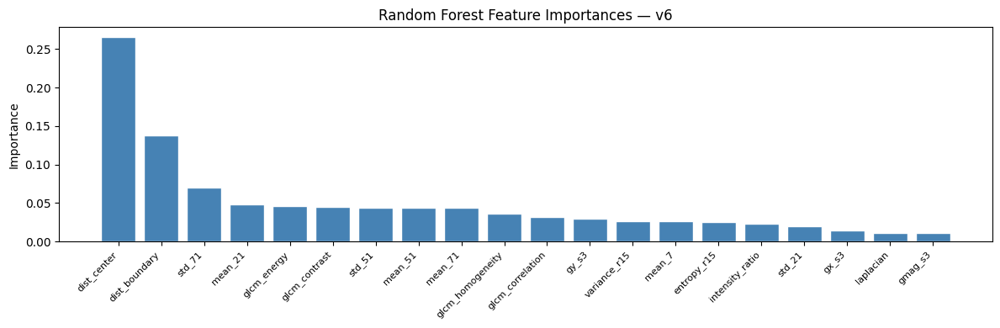

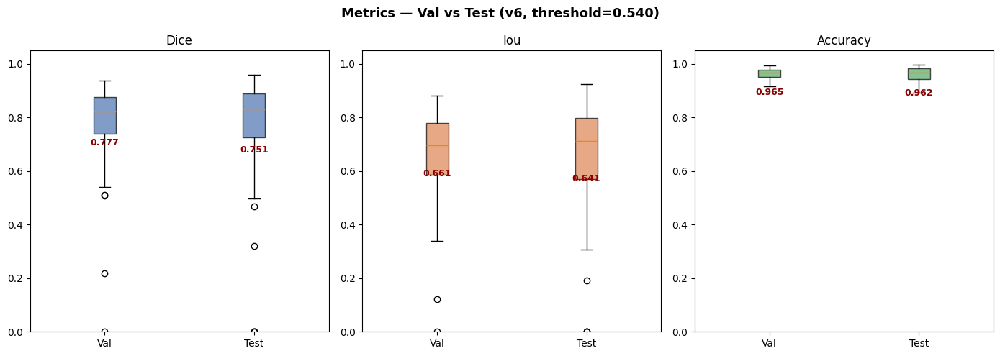

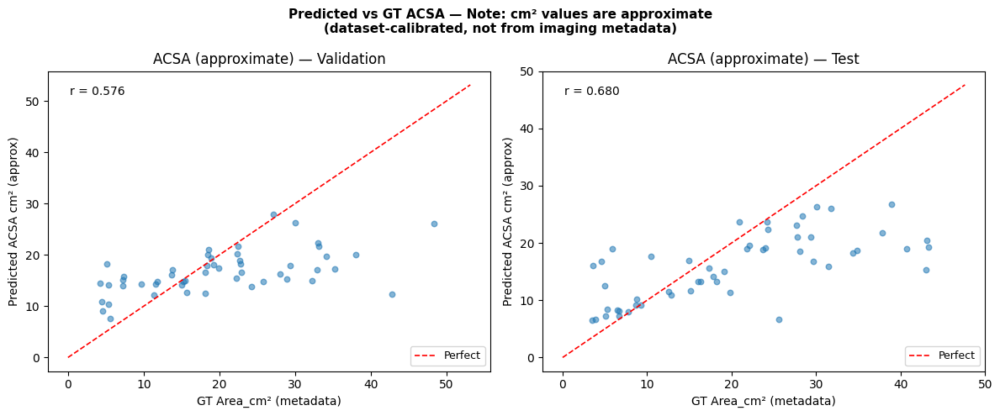


  Val set examples (3 images):


[ WARN:0@3061.650] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3061.650] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


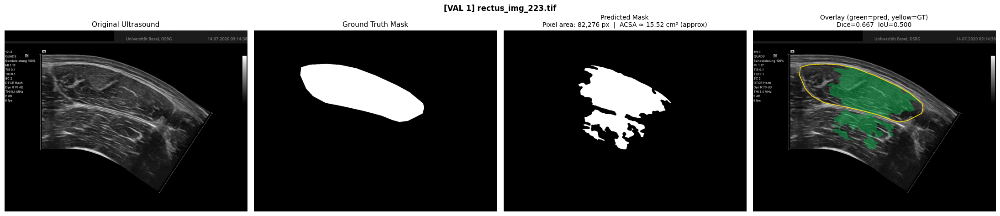

[ WARN:0@3069.060] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3069.060] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


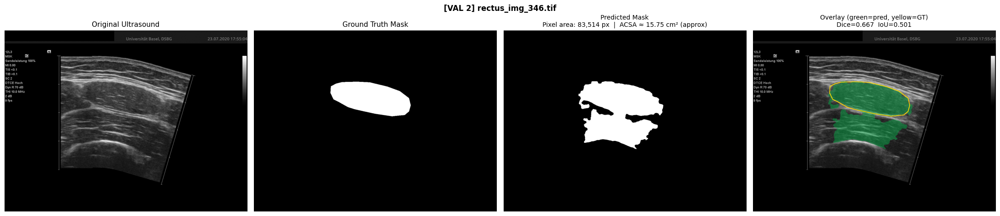

[ WARN:0@3075.829] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3075.829] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


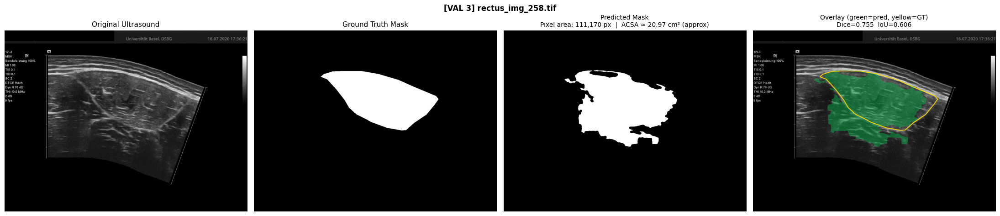

[ WARN:0@3082.564] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3082.564] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


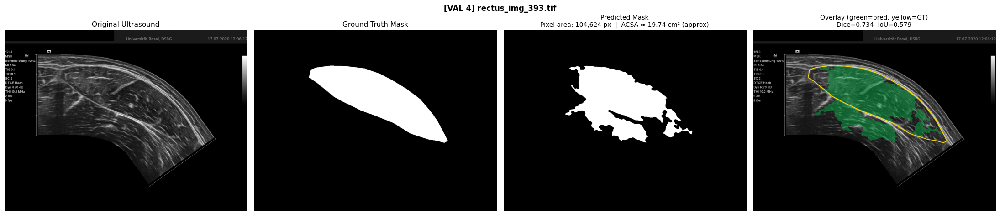

[ WARN:0@3089.743] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3089.743] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


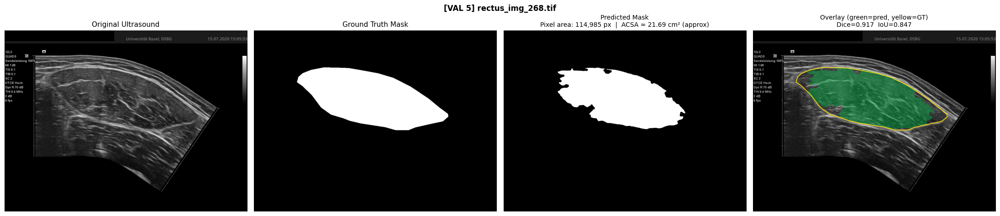

[ WARN:0@3097.330] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3097.330] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


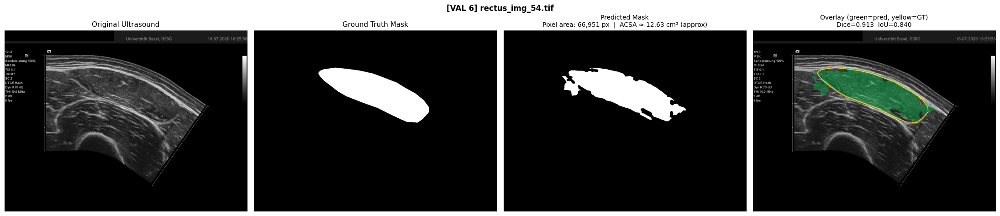

[ WARN:0@3104.301] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3104.301] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


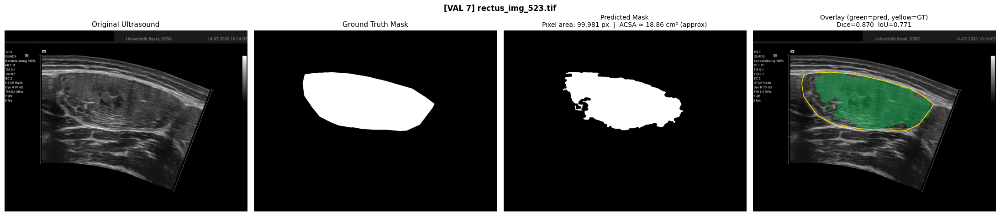

[ WARN:0@3111.733] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3111.733] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


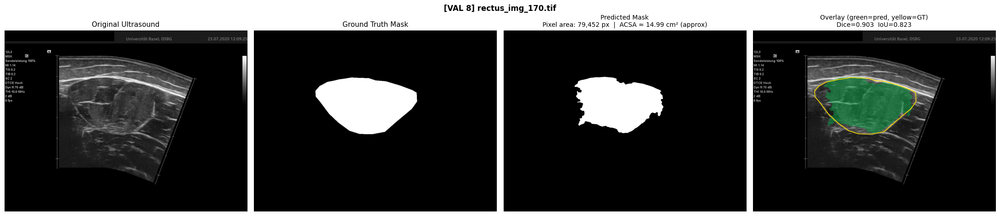

[ WARN:0@3118.448] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3118.448] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


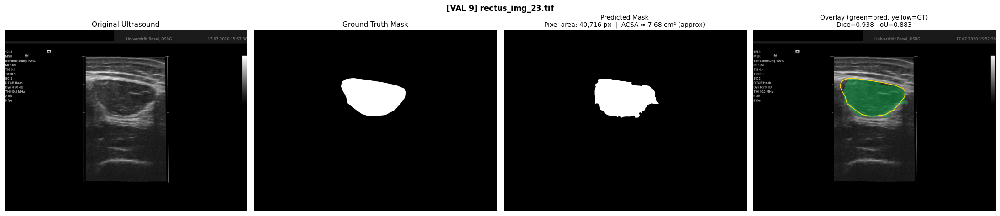

[ WARN:0@3124.478] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3124.478] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


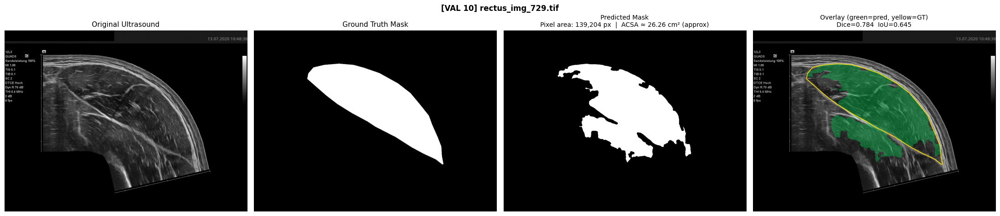


  Test set examples (3 images):


[ WARN:0@3132.061] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3132.061] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


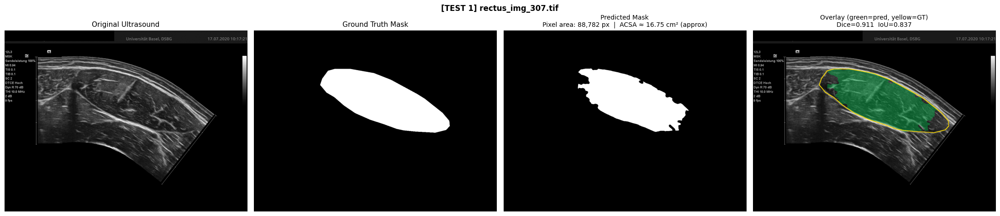

[ WARN:0@3139.281] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3139.281] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


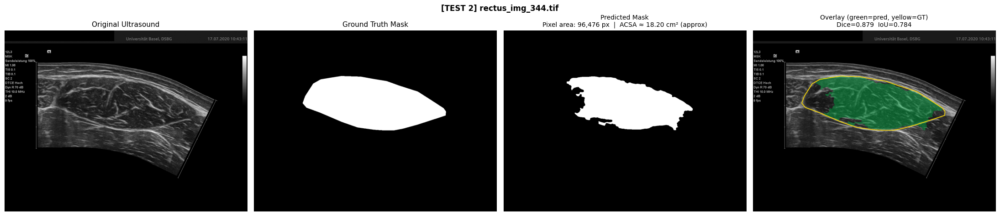

[ WARN:0@3146.226] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3146.226] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


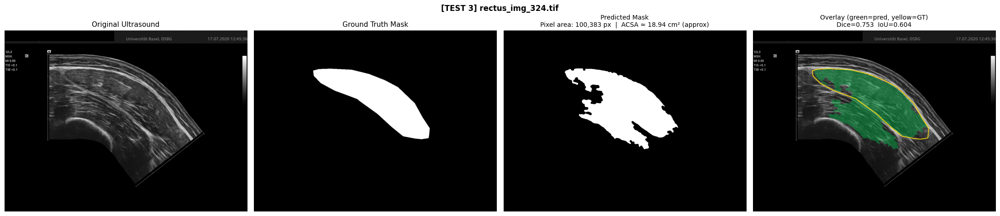

[ WARN:0@3153.019] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3153.019] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


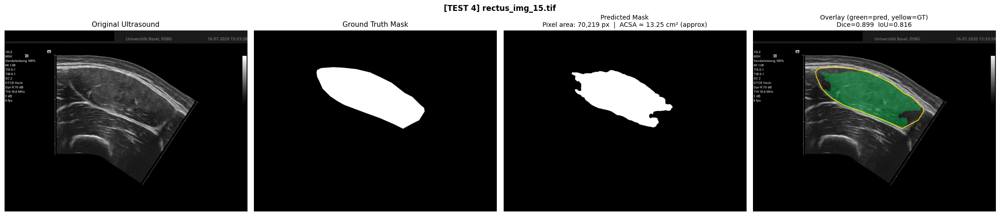

[ WARN:0@3159.592] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3159.592] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


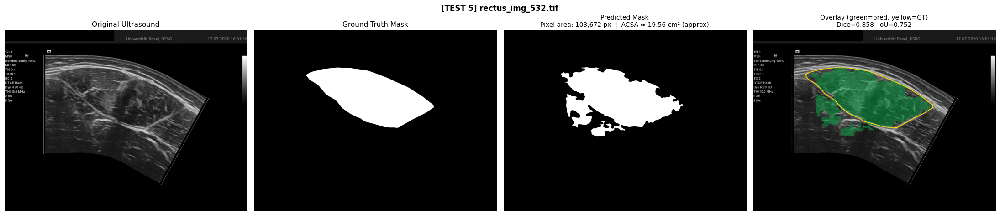

[ WARN:0@3166.584] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3166.584] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


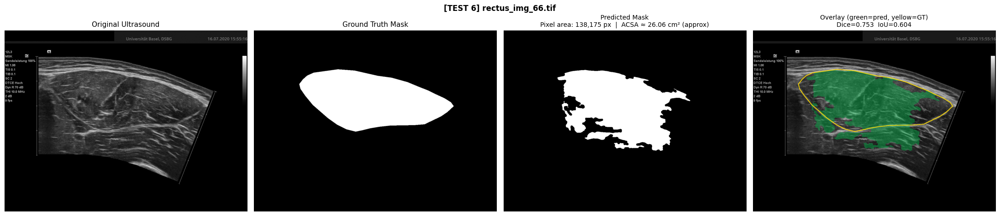

[ WARN:0@3173.777] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3173.777] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


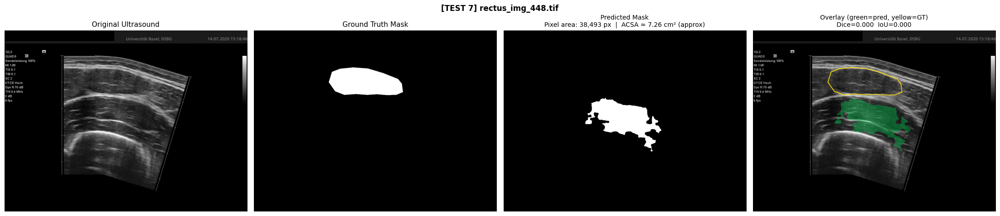

[ WARN:0@3180.879] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3180.879] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


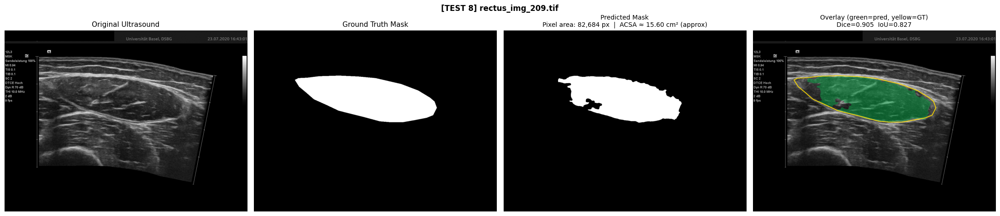

[ WARN:0@3188.357] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3188.357] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


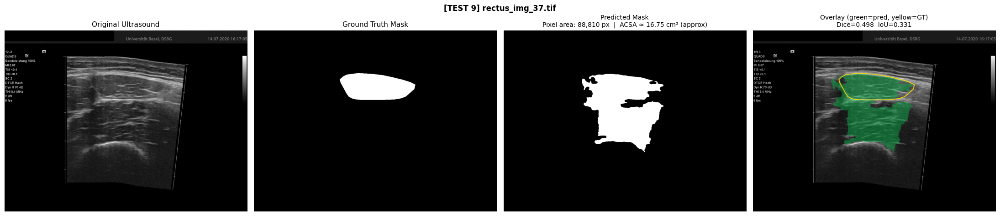

[ WARN:0@3195.031] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3195.031] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


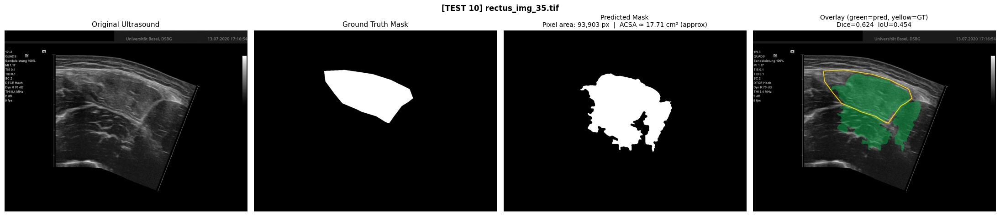

[ WARN:0@3201.862] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3201.862] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


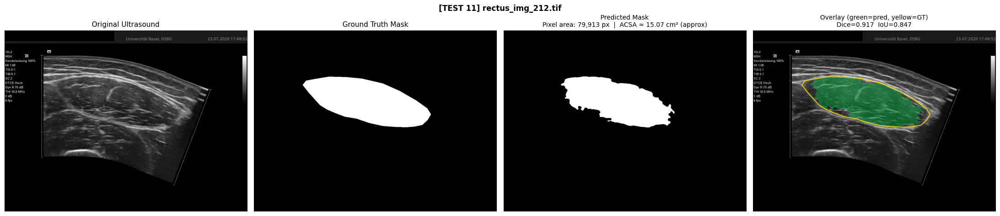

[ WARN:0@3208.908] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3208.908] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


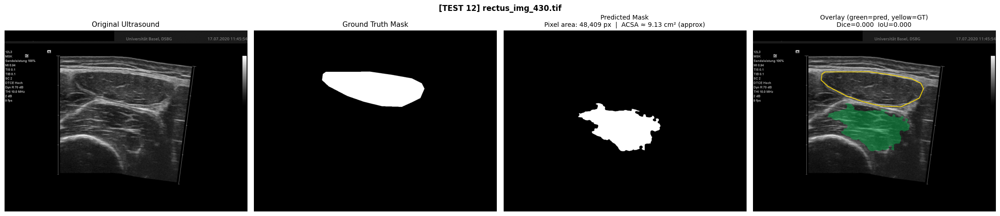

[ WARN:0@3215.675] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3215.675] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


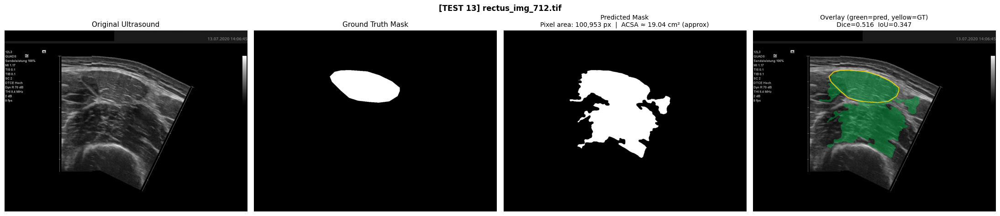

[ WARN:0@3222.563] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3222.563] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


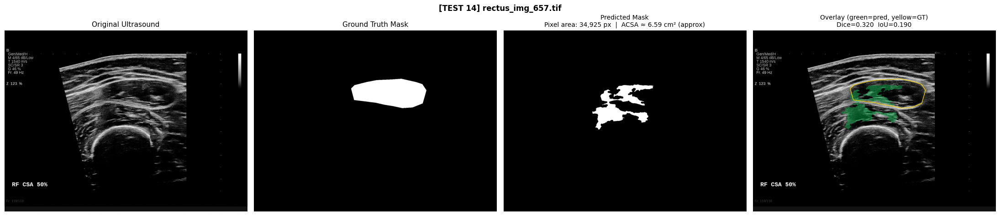

[ WARN:0@3233.450] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3233.450] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


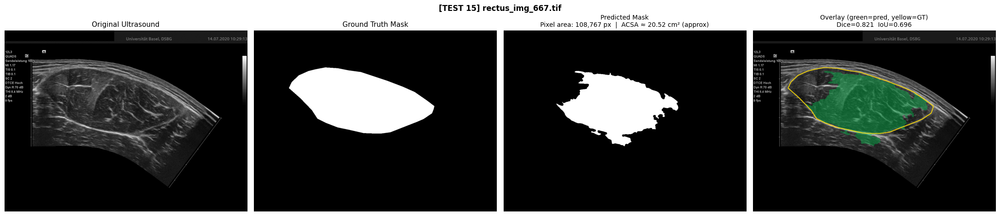

[ WARN:0@3240.565] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3240.565] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


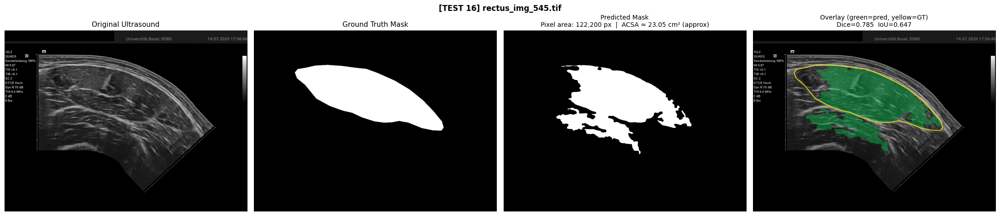

[ WARN:0@3247.866] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3247.866] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


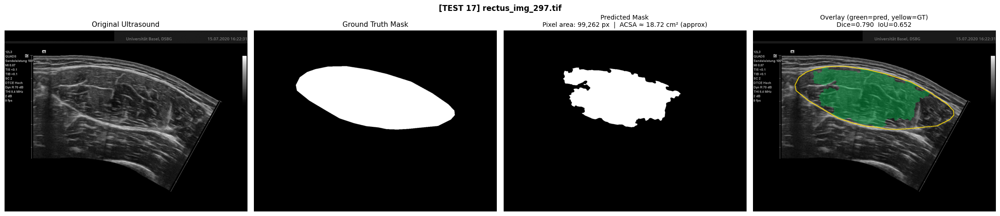

[ WARN:0@3255.512] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3255.512] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


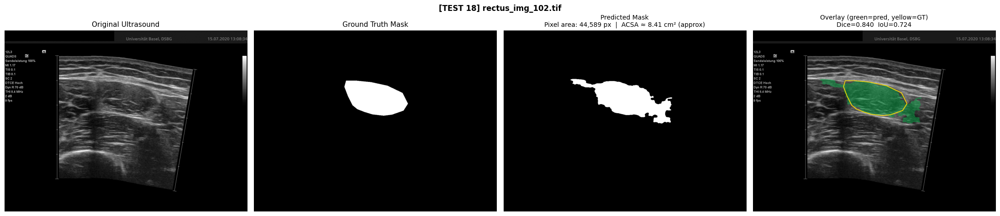

[ WARN:0@3262.916] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3262.916] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


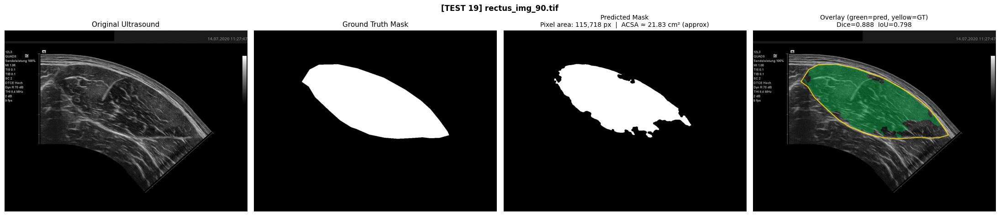

[ WARN:0@3270.225] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50838 (0xc696) encountered
[ WARN:0@3270.225] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 50839 (0xc697) encountered


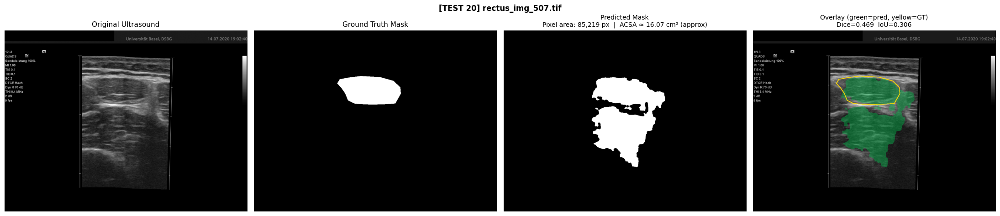

In [16]:
def show_segmentation(img_path, mask_path, clf, cal_dict, median_cal,
                      threshold, title=''):
    """
    4-panel visualization:
        Original ultrasound | Ground truth mask |
        Predicted mask      | Overlay (green=pred, yellow=GT boundary)
    """
    img_raw  = load_image_raw(img_path)
    mask_gt  = load_mask_raw(mask_path)
    cp       = cal_dict.get(img_path.stem, median_cal)
    out      = predict_image(img_raw, clf, threshold, cp)
    pred     = out['mask_orig']

    d  = dice(pred, mask_gt)
    j  = iou(pred,  mask_gt)
    px = out['pixel_area']
    cm = out['acsa_cm2_approx']

    img_rgb  = cv2.cvtColor(img_raw, cv2.COLOR_GRAY2RGB)
    overlay  = img_rgb.copy()
    overlay[pred == 1] = [0, 200, 80]
    panel4   = cv2.addWeighted(overlay, 0.40, img_rgb, 0.60, 0)
    gt_uint8 = (mask_gt * 255).astype(np.uint8)
    contours, _ = cv2.findContours(gt_uint8, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(panel4, contours, -1, (255, 220, 0), 2)

    fig, axes = plt.subplots(1, 4, figsize=(22, 5))
    axes[0].imshow(img_raw, cmap='gray')
    axes[0].set_title('Original Ultrasound', fontsize=11)
    axes[1].imshow(mask_gt, cmap='gray', vmin=0, vmax=1)
    axes[1].set_title('Ground Truth Mask', fontsize=11)
    axes[2].imshow(pred, cmap='gray', vmin=0, vmax=1)
    axes[2].set_title(
        f'Predicted Mask\n'
        f'Pixel area: {px:,} px  |  ACSA ≈ {cm:.2f} cm² (approx)', fontsize=10)
    axes[3].imshow(panel4)
    axes[3].set_title(
        f'Overlay (green=pred, yellow=GT)\n'
        f'Dice={d:.3f}  IoU={j:.3f}', fontsize=10)
    for ax in axes:
        ax.axis('off')
    fig.suptitle(f'{title}{img_path.name}', fontsize=12, fontweight='bold')
    plt.tight_layout()
    ipy_display(fig)
    plt.close(fig)


def show_feature_importance(clf):
    imps = clf.feature_importances_
    idx  = np.argsort(imps)[::-1]
    fig, ax = plt.subplots(figsize=(12, 4))
    ax.bar(range(len(imps)), imps[idx], color='steelblue', edgecolor='white')
    ax.set_xticks(range(len(imps)))
    ax.set_xticklabels([FEATURE_NAMES[i] for i in idx],
                       rotation=45, ha='right', fontsize=8)
    ax.set_ylabel('Importance')
    ax.set_title('Random Forest Feature Importances — v6')
    plt.tight_layout()
    ipy_display(fig)
    plt.close(fig)


def show_metrics(val_df, test_df):
    fig, axes = plt.subplots(1, 3, figsize=(14, 5))
    for ax, metric, color in zip(
            axes, ['dice', 'iou', 'accuracy'],
            ['#4C72B0', '#DD8452', '#55A868']):
        data = [val_df[metric].dropna(), test_df[metric].dropna()]
        bp   = ax.boxplot(data, patch_artist=True, labels=['Val', 'Test'])
        for patch in bp['boxes']:
            patch.set_facecolor(color)
            patch.set_alpha(0.7)
        ax.set_ylim([0, 1.05])
        ax.set_title(metric.capitalize(), fontsize=12)
        for k, d in enumerate(data, 1):
            ax.text(k, max(0.02, d.mean() - 0.08),
                    f'{d.mean():.3f}', ha='center',
                    fontsize=9, color='darkred', fontweight='bold')
    fig.suptitle(f'Metrics — Val vs Test (v6, threshold={OPTIMAL_THRESHOLD:.3f})',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    ipy_display(fig)
    plt.close(fig)


def show_acsa_scatter(val_df, test_df, metadata):
    meta_dict = dict(zip(metadata['stem'], metadata['Area_cm2']))
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    for ax, df, title in zip(axes, [val_df, test_df], ['Validation', 'Test']):
        gt_list, pred_list = [], []
        for _, row in df.iterrows():
            stem = Path(row['image']).stem
            gt   = meta_dict.get(stem)
            if gt is not None and not (isinstance(gt, float) and np.isnan(float(gt))):
                gt_list.append(float(gt))
                pred_list.append(float(row['acsa_cm2_approx']))
        if gt_list:
            ax.scatter(gt_list, pred_list, alpha=0.55, s=22)
            lim = max(max(gt_list), max(pred_list)) * 1.1
            ax.plot([0, lim], [0, lim], 'r--', lw=1.2, label='Perfect')
            r = float(np.corrcoef(gt_list, pred_list)[0, 1])
            ax.text(0.05, 0.92, f'r = {r:.3f}', transform=ax.transAxes, fontsize=10)
            ax.set_xlabel('GT Area_cm² (metadata)')
            ax.set_ylabel('Predicted ACSA cm² (approx)')
            ax.legend(fontsize=9)
        ax.set_title(f'ACSA (approximate) — {title}')
    fig.suptitle('Predicted vs GT ACSA — Note: cm² values are approximate\n'
                 '(dataset-calibrated, not from imaging metadata)',
                 fontsize=11, fontweight='bold')
    plt.tight_layout()
    ipy_display(fig)
    plt.close(fig)


print('[VISUALIZATION]')
show_feature_importance(clf)
show_metrics(val_df, test_df)
show_acsa_scatter(val_df, test_df, metadata)

print('\n  Val set examples (3 images):')
for i, (ip, mp) in enumerate(val_pairs[:10]):
    show_segmentation(ip, mp, clf, cal_dict, median_cal,
                      OPTIMAL_THRESHOLD, title=f'[VAL {i+1}] ')

print('\n  Test set examples (3 images):')
for i, (ip, mp) in enumerate(test_pairs[:20]):
    show_segmentation(ip, mp, clf, cal_dict, median_cal,
                      OPTIMAL_THRESHOLD, title=f'[TEST {i+1}] ')

## Section 16 — Prediction API

Use `predict_new_image` to segment any new ultrasound image.  
The function accepts a file path or a numpy uint8 array.

In [17]:
def predict_new_image(image_input, clf, threshold, median_cal):
    """
    Segment a new unseen ultrasound image.

    Args:
        image_input : file path (str/Path) or numpy uint8 grayscale array
        clf         : trained RandomForestClassifier
        threshold   : optimal threshold from validation tuning
        median_cal  : median cm²/pixel from training calibration

    Returns:
        dict with mask_orig, pixel_area, acsa_cm2_approx, proba_orig, crop_bbox
    """
    if isinstance(image_input, (str, Path)):
        img_raw  = load_image_raw(Path(image_input))
        img_name = Path(image_input).name
    elif isinstance(image_input, np.ndarray):
        img_raw  = image_input.copy()
        if img_raw.ndim == 3:
            img_raw = cv2.cvtColor(img_raw, cv2.COLOR_BGR2GRAY)
        img_name = 'array_input'
    else:
        raise TypeError('image_input must be a path or numpy array')

    out = predict_image(img_raw, clf, threshold, median_cal)

    print(f'\n[PREDICTION — {img_name}]')
    print(f'  Crop bbox        : {out["crop_bbox"]}')
    print(f'  Pixel area       : {out["pixel_area"]:,} px  ← primary output')
    print(f'  ACSA (approx)    : {out["acsa_cm2_approx"]:.4f} cm²  ← approximate, dataset-calibrated')

    img_rgb  = cv2.cvtColor(img_raw, cv2.COLOR_GRAY2RGB)
    overlay  = img_rgb.copy()
    overlay[out['mask_orig'] == 1] = [0, 200, 80]
    panel_ov = cv2.addWeighted(overlay, 0.40, img_rgb, 0.60, 0)

    fig, axes = plt.subplots(1, 3, figsize=(17, 5))
    axes[0].imshow(img_raw, cmap='gray')
    axes[0].set_title('Original Ultrasound')
    axes[1].imshow(out['mask_orig'], cmap='gray', vmin=0, vmax=1)
    axes[1].set_title(f'Predicted Mask\nPixel area: {out["pixel_area"]:,} px')
    axes[2].imshow(panel_ov)
    axes[2].set_title(f'Overlay\nACSA ≈ {out["acsa_cm2_approx"]:.3f} cm² (approx)')
    for ax in axes:
        ax.axis('off')
    fig.suptitle(f'Prediction: {img_name}', fontsize=12)
    plt.tight_layout()
    ipy_display(fig)
    plt.close(fig)

    return out


print('✓ Prediction API defined')

✓ Prediction API defined


## Section 17 — Summary

In [18]:
print('\n' + '=' * 65)
print('  PIPELINE COMPLETE — v6')
print('=' * 65)
print(f'\n  Split          : {len(train_pairs)} train | {len(val_pairs)} val | {len(test_pairs)} test')
print(f'  Features       : {N_FEATURES} (removed gx_s1, gy_s1, gmag_s1, std_7 vs v5)')
print(f'  Sampling       : {cfg.N_MUSCLE} muscle / {cfg.N_BOUNDARY_NEG} boundary / {cfg.N_RANDOM_NEG} random per image')
print(f'  Augmentation   : intensity-only (brightness, contrast, noise)')
print(f'  Optimal threshold: {OPTIMAL_THRESHOLD:.3f} (tuned on val)')
print(f'\n  VAL  → Dice {val_df["dice"].mean():.4f} | '
      f'IoU {val_df["iou"].mean():.4f} | '
      f'Acc {val_df["accuracy"].mean():.4f}')
print(f'  TEST → Dice {test_df["dice"].mean():.4f} | '
      f'IoU {test_df["iou"].mean():.4f} | '
      f'Acc {test_df["accuracy"].mean():.4f}')
print(f'\n  ACSA calibration : {median_cal:.6f} cm²/pixel (median, approximate)')
print(f'\n  Saved:')
print(f'    {cfg.MODEL_PATH}')
print(f'    {cfg.OUTPUT_DIR / "evaluation_v6.csv"}')
print(f'    {cfg.RESULTS_PATH}')
print(f'\n  To predict on a new image:')
print(f'    result = predict_new_image("scan.tif", clf, OPTIMAL_THRESHOLD, median_cal)')
print(f'    print(result["pixel_area"], "px")')
print(f'    print(result["acsa_cm2_approx"], "cm² (approx)")')
print('=' * 65)


  PIPELINE COMPLETE — v6

  Split          : 236 train | 50 val | 52 test
  Features       : 20 (removed gx_s1, gy_s1, gmag_s1, std_7 vs v5)
  Sampling       : 1500 muscle / 2000 boundary / 500 random per image
  Augmentation   : intensity-only (brightness, contrast, noise)
  Optimal threshold: 0.540 (tuned on val)

  VAL  → Dice 0.7769 | IoU 0.6608 | Acc 0.9645
  TEST → Dice 0.7507 | IoU 0.6412 | Acc 0.9624

  ACSA calibration : 0.000189 cm²/pixel (median, approximate)

  Saved:
    /kaggle/working/outputs/rf_model_v6.joblib
    /kaggle/working/outputs/evaluation_v6.csv
    /kaggle/working/outputs/results_v6.json

  To predict on a new image:
    result = predict_new_image("scan.tif", clf, OPTIMAL_THRESHOLD, median_cal)
    print(result["pixel_area"], "px")
    print(result["acsa_cm2_approx"], "cm² (approx)")
